<a href="https://colab.research.google.com/github/GurjarAkshay/Covid19-project/blob/main/data_extraction_covid.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project Info:
## Covid 19 has been adversely impacting our lives for a long time now. In this project, we will extract data from a JSON file containing various information like daily cases, deaths, recovery etc. for each State and union territory.
### We will use the data to gain some insight about covid 19 situation in India.
### **Insights we are looking for:** 
1. Dailly cases, recoverd, deaths, vaccinated, tested etc.
2. Performace of States and UTs on the above parameters on a time frame.
3. We will also deep dive and calculate Case Fatality Ratio and Test Positivity Ratio.
4. We will use these above parameters to compare States and UTs performances.
5. We will also compute the same parameters for Districts.
6. Finally we will plot some graphs to visualize these parameters.

**About DATA:**
I have taken the data from "https://data.covid19india.org/". The data source is not official. Also the data is only available from 9 April 2020 to 31 October 2021.

JSON Schema for reference: https://data.covid19india.org/documentation/timeseries.min.html



In [ ]:
import pandas as pd
import json
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
f = open("timeseriesmin.json")
data = json.load(f)
data

{'AN': {'dates': {'2020-03-26': {'delta': {'confirmed': 1},
    'delta7': {'confirmed': 1},
    'total': {'confirmed': 1}},
   '2020-03-27': {'delta': {'confirmed': 5},
    'delta7': {'confirmed': 6},
    'total': {'confirmed': 6}},
   '2020-03-28': {'delta': {'confirmed': 3},
    'delta7': {'confirmed': 9},
    'total': {'confirmed': 9}},
   '2020-03-29': {'delta7': {'confirmed': 9}, 'total': {'confirmed': 9}},
   '2020-03-30': {'delta': {'confirmed': 1},
    'delta7': {'confirmed': 10},
    'total': {'confirmed': 10}},
   '2020-03-31': {'delta7': {'confirmed': 10}, 'total': {'confirmed': 10}},
   '2020-04-01': {'delta7': {'confirmed': 10}, 'total': {'confirmed': 10}},
   '2020-04-02': {'delta7': {'confirmed': 9}, 'total': {'confirmed': 10}},
   '2020-04-03': {'delta7': {'confirmed': 4}, 'total': {'confirmed': 10}},
   '2020-04-04': {'delta7': {'confirmed': 1}, 'total': {'confirmed': 10}},
   '2020-04-05': {'delta7': {'confirmed': 1}, 'total': {'confirmed': 10}},
   '2020-04-06': {'to

In [ ]:
type(data)

dict

Extracting States and UTs names.

In [ ]:
states_names=[]
for dict1 in data:
        states_names.append(dict1)

In [ ]:
dates = []
for dict1 in data:
    #print(dict1)
    #print(data[dict1]["dates"].keys())
    dates.append(data[dict1]["dates"].keys())




In [ ]:
type(dates)

list

Extracting dates along the States names.

In [ ]:
state1 = []
date1 = []
for key1, value1 in data.items():
    #print(key1)
    for key2, value2 in value1.items() :
        for k3,v3 in value2.items():
            #print(k3)
            state1.append(key1)
            date1.append(k3)
            
print(len(state1))
print(len(date1))

21678
21678


In [ ]:
list1 = list(zip(date1,state1))
df_list1 = pd.DataFrame(list1,columns= ['Dates',"States"])

### Extarcting daily confirmend cases info and joing it with the dataframe created above which contains the dates and states.
Note: Data is extracted linerly i.e. for each date therefore suppose if there are no confirmed cases on a particular day it will add 'na' to that date.
  

In [ ]:
confirmed=[]
dates_confirmed = []

for key1, value1 in data.items():
    for key2, value2 in value1.items() :
        for k3,v3 in value2.items():
            if "delta" in v3:
                for k4,v4 in v3.items():
                   if k4 == "delta" and "confirmed" in v4:
                       #print(v4["confirmed"],k3)
                       confirmed.append(v4["confirmed"])
                       dates_confirmed.append(k3)
                   elif k4== "delta" and "confirmed" not in v4:
                        confirmed.append("na")
                        dates_confirmed.append(k3)
                   #else:
                        #print("na")
                        #confirmed.append("na")
            else:
                #print("na",k3)
                confirmed.append("na")
                dates_confirmed.append(k3)


In [ ]:
list2 = list(zip(dates_confirmed,confirmed))
df_list2 = pd.DataFrame(list2,columns=["Dates","Daily Confirmed"])

In [ ]:
dataset_merged1=pd.merge(df_list1, df_list2, left_index=True, right_index=True)
dataset_merged1.drop(columns="Dates_y", inplace= True)
dataset_merged1.rename(columns={"Dates_x":"Dates"},inplace=True)


In [ ]:
#pd.concat([df_list1, df_list2], axis=1)

Similarly now I will extract recovered, deceased, tested, vaccinated data and merge these data points to the above data frame.

In [ ]:
recovered=[]
dates_recovered = []

for key1, value1 in data.items():
    for key2, value2 in value1.items() :
        for k3,v3 in value2.items():
            if "delta" in v3:
                for k4,v4 in v3.items():
                   if k4 == "delta" and "recovered" in v4:
                       #print(v4["confirmed"],k3)
                       recovered.append(v4["recovered"])
                       dates_recovered.append(k3)
                   elif k4== "delta" and "recovered" not in v4:
                        recovered.append("na")
                        dates_recovered.append(k3)
                   
            else:
                recovered.append("na")
                dates_recovered.append(k3)

In [ ]:
list_recovered = list(zip(dates_recovered,recovered))
df_recovered = pd.DataFrame(list_recovered,columns=["Dates","Daily Recovered"])


In [ ]:
dataset_merged2=pd.merge(dataset_merged1, df_recovered, left_index=True, right_index=True)
dataset_merged2.drop(columns="Dates_y", inplace= True)
dataset_merged2.rename(columns={"Dates_x":"Dates"},inplace=True)

In [ ]:
deceased=[]
dates_deceased = []

for key1, value1 in data.items():
    for key2, value2 in value1.items() :
        for k3,v3 in value2.items():
            if "delta" in v3:
                for k4,v4 in v3.items():
                   if k4 == "delta" and "deceased" in v4:
                       deceased.append(v4["deceased"])
                       dates_deceased.append(k3)
                   elif k4== "delta" and "deceased" not in v4:
                        deceased.append("na")
                        dates_deceased.append(k3)
                   
            else:
                deceased.append("na")
                dates_deceased.append(k3)

In [ ]:
list_deceased = list(zip(dates_deceased,deceased))
df_deceased = pd.DataFrame(list_deceased,columns=["Dates","Daily Deceased"])

In [ ]:
dataset_merged3=pd.merge(dataset_merged2, df_deceased, left_index=True, right_index=True)
dataset_merged3.drop(columns="Dates_y", inplace= True)
dataset_merged3.rename(columns={"Dates_x":"Dates"},inplace=True)

In [ ]:
tested=[]
dates_tested = []

for key1, value1 in data.items():
    for key2, value2 in value1.items() :
        for k3,v3 in value2.items():
            if "delta" in v3:
                for k4,v4 in v3.items():
                   if k4 == "delta" and "tested" in v4:
                       tested.append(v4["tested"])
                       dates_tested.append(k3)
                   elif k4== "delta" and "tested" not in v4:
                        tested.append("na")
                        dates_tested.append(k3)
                   
            else:
                tested.append("na")
                dates_tested.append(k3)

In [ ]:
list_tested = list(zip(dates_tested,tested))
df_tested = pd.DataFrame(list_tested,columns=["Dates","Daily Tested"])

In [ ]:
dataset_merged4=pd.merge(dataset_merged3, df_tested, left_index=True, right_index=True)
dataset_merged4.drop(columns="Dates_y", inplace= True)
dataset_merged4.rename(columns={"Dates_x":"Dates"},inplace=True)


In [ ]:
vaccinated=[]
dates_vaccinated = []

for key1, value1 in data.items():
    for key2, value2 in value1.items() :
        for k3,v3 in value2.items():
            if "delta" in v3:
                for k4,v4 in v3.items():
                   if k4 == "delta" and "vaccinated1" in v4:
                       vaccinated.append(v4["vaccinated1"])
                       dates_vaccinated.append(k3)
                   elif k4== "delta" and "vaccinated1" not in v4:
                        vaccinated.append("na")
                        dates_vaccinated.append(k3)
                   
            else:
                vaccinated.append("na")
                dates_vaccinated.append(k3)

In [ ]:
list_vaccinated = list(zip(dates_vaccinated,vaccinated))
df_vaccinated = pd.DataFrame(list_vaccinated,columns=["Dates","Daily Vaccinated"])


Now i will create the final data frame containig Dates, States, Daily confirmed, Daily Recovered, Daily deceased, Daily tested, Daily vaccinated.


In [ ]:
dataset_merged_daily=pd.merge(dataset_merged4, df_vaccinated, left_index=True, right_index=True)
dataset_merged_daily.drop(columns="Dates_y", inplace= True)
dataset_merged_daily.rename(columns={"Dates_x":"Dates"},inplace=True)
dataset_merged_daily


,Dates,States,Daily Confirmed,Daily Recovered,Daily Deceased,Daily Tested,Daily Vaccinated
0,2020-03-26,AN,1,na,na,na,na
1,2020-03-27,AN,5,na,na,na,na
2,2020-03-28,AN,3,na,na,na,na
3,2020-03-29,AN,na,na,na,na,na
4,2020-03-30,AN,1,na,na,na,na
...,...,...,...,...,...,...,...
21673,2021-10-27,WB,976,837,15,43322,323292
21674,2021-10-28,WB,990,845,9,45437,532317
21675,2021-10-29,WB,982,860,8,49017,701727
21676,2021-10-30,WB,980,880,13,47131,756507


### Now i will extact the data of same parameters. This data is not on daily format instead it is cumulative.
### For example confirmed cases on xyz date will give us total number of cases upto that day i.e. adding all the cases till that date.
**Note**: Instead of using for loops again and again for each parameters I will combine all the for loops into one. 


In [ ]:
confirmed_total=[]
recovered_total=[]
deceased_total=[]
tested_total = []
vaccinated_total=[]
dates_total = []

for key1, value1 in data.items():
    for key2, value2 in value1.items() :
        for k3,v3 in value2.items():
            if "total" in v3:
                for k4,v4 in v3.items():
                   if k4 == "total" and "confirmed" in v4:
                       confirmed_total.append(v4["confirmed"])
                       dates_total.append(k3)
                   elif k4== "total" and "confirmed" not in v4:
                        confirmed_total.append("na")
                        dates_total.append(k3)
                   
            else:
                confirmed_total.append("na")
                dates_total.append(k3)
            
            
            
            if "total" in v3:
                for k4,v4 in v3.items():
                   if k4 == "total" and "recovered" in v4:
                       recovered_total.append(v4["recovered"])
                   elif k4== "total" and "recovered" not in v4:
                        recovered_total.append("na")
                   
            else:
                recovered_total.append("na")



            if "total" in v3:
                for k4,v4 in v3.items():
                   if k4 == "total" and "deceased" in v4:
                       deceased_total.append(v4["deceased"])
                   elif k4== "total" and "deceased" not in v4:
                        deceased_total.append("na")
            else:
                deceased_total.append("na")

            

            if "total" in v3:
                for k4,v4 in v3.items():
                   if k4 == "total" and "tested" in v4:
                       tested_total.append(v4["tested"])
                   elif k4== "total" and "tested" not in v4:
                        tested_total.append("na")
            else:
                tested_total.append("na")
            
            
            
            
            if "total" in v3:
                for k4,v4 in v3.items():
                   if k4 == "total" and "vaccinated1" in v4:
                       vaccinated_total.append(v4["vaccinated1"])
                   elif k4== "total" and "vaccinated1" not in v4:
                        vaccinated_total.append("na")    
            else:
                vaccinated_total.append("na")

In [ ]:
print(len(confirmed_total))
print(len(recovered_total))
print(len(deceased_total))
print(len(tested_total))
print(len(vaccinated_total))
print(len(dates_total))

21678
21678
21678
21678
21678
21678


In [ ]:
column_names = ["Dates","Total Confirmed","Total Recovered","Total Deceased","Total Tested","Total Vaccinated"]
list_total = list(zip(dates_total,confirmed_total,recovered_total,deceased_total,tested_total,vaccinated_total))
df_total = pd.DataFrame(list_total,columns=column_names)


In [ ]:
dataset_total = pd.merge(df_list1,df_total,left_index=True,right_index=True)
dataset_total.drop(columns="Dates_y",inplace=True)
dataset_total.rename(columns={"Dates_x":"Dates"},inplace=True)

In [ ]:
dataset_merged_daily.replace("na",np.NaN,inplace=True)
dataset_merged_daily.fillna(0,inplace=True)
dataset_total.replace("na",np.NaN,inplace=True)
dataset_total.fillna(0,inplace=True)
dataset_total

,Dates,States,Total Confirmed,Total Recovered,Total Deceased,Total Tested,Total Vaccinated
0,2020-03-26,AN,1.0,0.0,0.0,0.0,0.0
1,2020-03-27,AN,6.0,0.0,0.0,0.0,0.0
2,2020-03-28,AN,9.0,0.0,0.0,0.0,0.0
3,2020-03-29,AN,9.0,0.0,0.0,0.0,0.0
4,2020-03-30,AN,10.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...
21673,2021-10-27,WB,1589042.0,1561973.0,19096.0,19039301.0,53992006.0
21674,2021-10-28,WB,1590032.0,1562818.0,19105.0,19084738.0,54524323.0
21675,2021-10-29,WB,1591014.0,1563678.0,19113.0,19133755.0,55226050.0
21676,2021-10-30,WB,1591994.0,1564558.0,19126.0,19180886.0,55982557.0


## Saving these data frames to excel for visualizing in Power BI.

In [ ]:
dataset_merged_daily.to_excel("daily_covid_records.xlsx",index =False)
dataset_total.to_excel("Total_covid_record.xlsx",index=False)

Now extracting districts data.

In [ ]:
f2 = open("data.min.json")
data2 = json.load(f2)
data2

{'AN': {'delta': {'tested': 1376, 'vaccinated1': 3, 'vaccinated2': 13},
  'delta21_14': {'confirmed': 9},
  'delta7': {'confirmed': 3,
   'recovered': 5,
   'tested': 8936,
   'vaccinated1': 884,
   'vaccinated2': 10640},
  'districts': {'Nicobars': {'delta7': {'vaccinated1': 62, 'vaccinated2': 811},
    'meta': {'population': 36842},
    'total': {'vaccinated1': 25394, 'vaccinated2': 20313}},
   'North and Middle Andaman': {'delta': {'vaccinated2': 8},
    'delta7': {'vaccinated1': 90, 'vaccinated2': 1839},
    'meta': {'population': 105597},
    'total': {'vaccinated1': 78945, 'vaccinated2': 59522}},
   'South Andaman': {'delta': {'vaccinated1': 3, 'vaccinated2': 28},
    'delta7': {'vaccinated1': 732, 'vaccinated2': 8012},
    'meta': {'population': 238142},
    'total': {'vaccinated1': 189662, 'vaccinated2': 120322}},
   'Unknown': {'delta21_14': {'confirmed': 9},
    'delta7': {'confirmed': 3, 'recovered': 5},
    'total': {'confirmed': 7651, 'deceased': 129, 'recovered': 7518}}},

In [ ]:
state_district = [] 
districts = []
District_confirmed= []
District_deceased = []
District_recovered=[]
District_tested=[]
District_vaccinated1=[]
District_vaccinated2=[]
for key1,value1 in data2.items():
    #print(key1)
    for key2,value2 in value1.items():
        #print(key2)
        if  key2 == "districts":
            for key3,value3 in value2.items():
                #print(key3)
                for key4,value4 in value3.items():
                    if key4 == "total" and "confirmed" in value4:
                        District_confirmed.append(value4["confirmed"])
                        state_district.append(key1)
                        districts.append(key3)
                    elif key4 == "total" and "confirmed" not in value4:
                        District_confirmed.append(0)
                        state_district.append(key1)
                        districts.append(key3)
                    
                    if key4 == "total" and "deceased" in value4:
                        District_deceased.append(value4["deceased"])
                    elif key4 == "total" and "deceased" not in value4:
                        District_deceased.append(0)

                    if key4 == "total" and "recovered" in value4:
                        District_recovered.append(value4["recovered"])
                    elif key4 == "total" and "recovered" not in value4:
                        District_recovered.append(0)
                    
                    if key4 == "total" and "tested" in value4:
                        District_tested.append(value4["tested"])
                    elif key4 == "total" and "tested" not in value4:
                        District_tested.append(0)
                    
                    if key4 == "total" and "vaccinated1" in value4:
                        District_vaccinated1.append(value4["vaccinated1"])
                    elif key4 == "total" and "vaccinated1" not in value4:
                        District_vaccinated1.append(0)

                    if key4 == "total" and "vaccinated2" in value4:
                        District_vaccinated2.append(value4["vaccinated2"])
                    elif key4 == "total" and "vaccinated2" not in value4:
                        District_vaccinated2.append(0)

                        

In [ ]:
print(len(state_district))
print(len(District_confirmed))
print(len(districts))
print(len(District_recovered))
print(len(District_deceased))
print(len(District_tested))
print(len(District_vaccinated1))
print(len(District_vaccinated2))


747
747
747
747
747
747
747
747


In [ ]:
list_district = list(zip(state_district,districts,District_confirmed,District_recovered,District_deceased,District_tested,District_vaccinated1,District_vaccinated2))
df_district = pd.DataFrame(list_district,columns=["States",'district','district_cases','recovered','deceased','tested','vaccinated1','vaccinated2'])
df_district.to_csv("District_details.csv",index=False)
df_district.to_excel("District_details.xlsx",index=False)
df_district['total_vaccines_administered'] = df_district["vaccinated1"]+df_district["vaccinated2"]
df_district



,States,district,district_cases,recovered,deceased,tested,vaccinated1,vaccinated2,total_vaccines_administered
0,AN,Nicobars,0,0,0,0,25394,20313,45707
1,AN,North and Middle Andaman,0,0,0,0,78945,59522,138467
2,AN,South Andaman,0,0,0,0,189662,120322,309984
3,AN,Unknown,7651,7518,129,0,0,0,0
4,AP,Anantapur,157843,156699,1093,787085,2690082,1611476,4301558
...,...,...,...,...,...,...,...,...,...
742,WB,Purba Bardhaman,42005,41588,198,0,2596246,859528,3455774
743,WB,Purba Medinipur,63098,62549,397,0,3560589,1471674,5032263
744,WB,Purulia,19419,19283,113,0,1679941,492310,2172251
745,WB,South 24 Parganas,100957,98950,1336,0,4850898,1832073,6682971


### Grouping Districts data by States to gain insight about final senario of States.
For example we can see Maharashtra "MH" has highest number of confirmed cases (66,11,078).

Dadra and Nagar Haveli and Daman and Diu have least number of deaths (4).

Uttar Pradesh (UP) has maximum number of people vaccinated by 1st dose (9.8Cr).


In [ ]:
df_district_grouped = df_district.groupby('States').agg({'district_cases':np.sum,
	                                            "recovered":np.sum
                                                ,"deceased":np.sum,
                                                "tested":np.sum,
                                                "vaccinated1":np.sum,
                                                "vaccinated2":np.sum,
                                                "total_vaccines_administered":np.sum}).reset_index()
df_district_grouped


,States,district_cases,recovered,deceased,tested,vaccinated1,vaccinated2,total_vaccines_administered
0,AN,7651,7518,129,0,294001,200157,494158
1,AP,2066450,2047722,14373,9788047,32976723,20374772,53351495
2,AR,55155,54774,280,398545,771875,534486,1306361
3,AS,610645,600974,5997,326318,20172070,8068572,28240642
4,BR,726098,716390,9661,17107895,49871471,18343468,68214939
5,CH,65351,64495,820,792851,926035,546981,1473016
6,CT,1006052,992159,13577,338344,14850127,7341840,22191967
7,DL,1439870,1414431,25091,29427753,13055636,7425404,20481040
8,DN,10681,10644,4,72410,660753,370253,1031006
9,GA,178108,174392,3364,0,1262558,911082,2173640


In [ ]:
states_pop=[]
population = []
for key1,value1 in data2.items():
    #print(key1)
    for key2,value2 in value1.items():
        if key2 == "meta":
            #print(key1,value2['population'])
            states_pop.append(key1)
            population.append(value2['population'])

In [ ]:
list_population = list(zip(states_pop,population))
df_population = pd.DataFrame(list_population,columns=["States","Population"])
#df_population

In [ ]:
df_district_grouped= pd.merge(df_district_grouped,df_population,how="left",left_on="States", right_on="States")
#df_district_grouped

Here we can see the States in descending by the total confirmed cases. 

In [ ]:
daily_cases_statewise = dataset_merged_daily.groupby("States").agg({"Daily Confirmed":np.sum,
                                                                    "Daily Recovered":np.sum,
                                                                    "Daily Deceased" :np.sum,
                                                                    "Daily Tested"   :np.sum,
                                                                    "Daily Vaccinated":np.sum

}).reset_index()
daily_cases_statewise.columns = ["States","Total Cases","Total Recovered","Total Deceased","Total Tested","Total Vaccinated"]
daily_cases_statewise.drop([33,34],inplace=True)
daily_cases_statewise.sort_values(by = 'Total Cases', ascending= False,inplace=True)
daily_cases_statewise

,States,Total Cases,Total Recovered,Total Deceased,Total Tested,Total Vaccinated
19,MH,6611078.0,6450585.0,140216.0,62667211.0,67198794.0
16,KL,4968657.0,4857181.0,31681.0,37886378.0,25306499.0
15,KA,2988333.0,2941578.0,38082.0,50873103.0,42497761.0
31,TN,2702623.0,2655015.0,36116.0,51159242.0,41279432.0
1,AP,2066450.0,2047722.0,14373.0,29518787.0,32976969.0
35,UP,1710158.0,1687151.0,22900.0,83635222.0,98178865.0
37,WB,1592908.0,1565471.0,19141.0,19228303.0,56192166.0
7,DL,1439870.0,1414431.0,25091.0,29427753.0,13055636.0
25,OR,1041457.0,1029147.0,8386.0,21994343.0,25736641.0
6,CT,1006052.0,992159.0,13577.0,13709510.0,14851682.0


In [ ]:
daily_cases_statewise = pd.merge(daily_cases_statewise,df_population,how="left",left_on="States", right_on="States")

### Now we will calculate the Case Fatality Ratio percentage for each State and UTs.
Fatality Ratio = (Total deaceased / Total cases) * 100

Fatality ratio percentage shows us the percentage of covid infected people died. It connects covid cases to covid deaths.

Fatality ratio is important because of the following points.
* When calculated on time frame we can see if the covid variant attacking people is deadly or not. i.e if the number of cases are increasing and so are the number of deaths than the covid variant if considered more deadly. on the other hand if the nummber of cases are increasing but the deaths are not then the virus is not that deadly.
* It also show us success of vaccines i.e. if the fatality rate is decreasing or increasing (on time frame) after vaccine administrations.
* Fatality ratio percentage is a better way to compare States/Uts.
 



In [ ]:
daily_cases_statewise["Case Fatality Ratio"] = daily_cases_statewise["Total Deceased"]/daily_cases_statewise["Total Cases"]*100
daily_cases_statewise 

,States,Total Cases,Total Recovered,Total Deceased,Total Tested,Total Vaccinated,Population,Case Fatality Ratio
0,MH,6611078.0,6450585.0,140216.0,62667211.0,67198794.0,122153000,2.120925
1,KL,4968657.0,4857181.0,31681.0,37886378.0,25306499.0,35125000,0.637617
2,KA,2988333.0,2941578.0,38082.0,50873103.0,42497761.0,65798000,1.274356
3,TN,2702623.0,2655015.0,36116.0,51159242.0,41279432.0,75695000,1.336331
4,AP,2066450.0,2047722.0,14373.0,29518787.0,32976969.0,52221000,0.695541
5,UP,1710158.0,1687151.0,22900.0,83635222.0,98178865.0,224979000,1.339058
6,WB,1592908.0,1565471.0,19141.0,19228303.0,56192166.0,96906000,1.201639
7,DL,1439870.0,1414431.0,25091.0,29427753.0,13055636.0,19814000,1.742588
8,OR,1041457.0,1029147.0,8386.0,21994343.0,25736641.0,43671000,0.805218
9,CT,1006052.0,992159.0,13577.0,13709510.0,14851682.0,28724000,1.349533


## Plotting total confirmed cases of states to determine which State/UT have highest, lowest, average Covid 19 **penetration.** 
**Note:** 1e6 in the graph represents 1 * 10^6 


<BarContainer object of 36 artists>

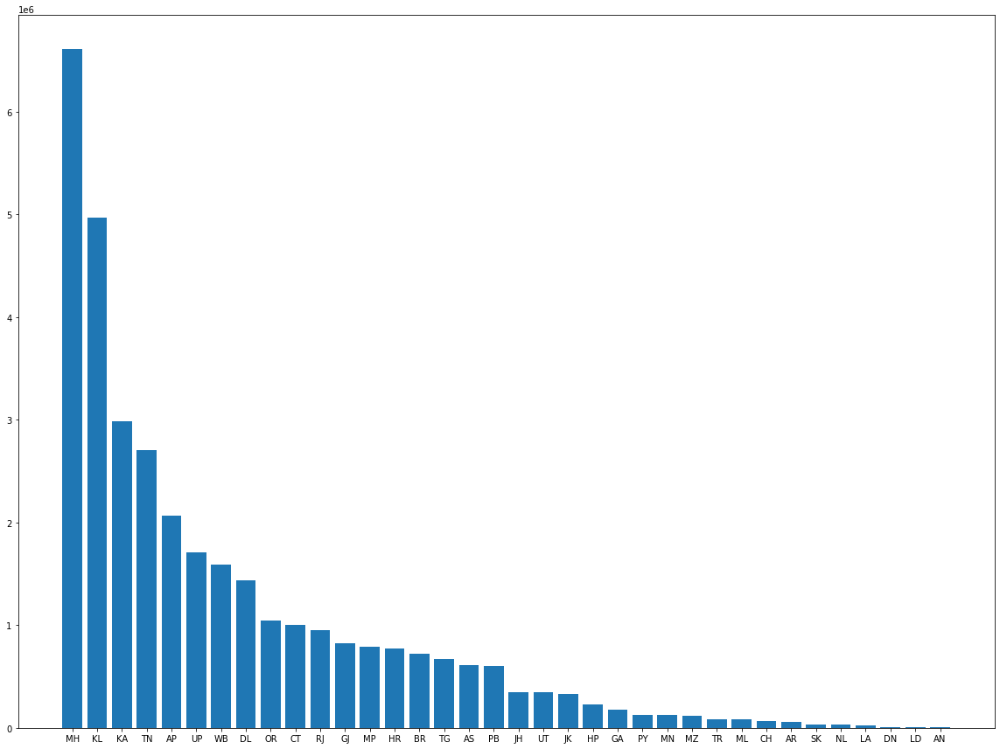

In [ ]:
fig = plt.figure(figsize=(20,15))
plt.bar(daily_cases_statewise["States"],daily_cases_statewise["Total Cases"])

In [ ]:
daily_cases_statewise.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36 entries, 0 to 35
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   States               36 non-null     object 
 1   Total Cases          36 non-null     float64
 2   Total Recovered      36 non-null     float64
 3   Total Deceased       36 non-null     float64
 4   Total Tested         36 non-null     float64
 5   Total Vaccinated     36 non-null     float64
 6   Population           36 non-null     int64  
 7   Case Fatality Ratio  36 non-null     float64
dtypes: float64(6), int64(1), object(1)
memory usage: 2.5+ KB


In [ ]:
daily_cases_statewise.shape[0]

36

Plotting total cases of states to total deceased.

Text(0.5, 0, 'Total Cases in *10^6')

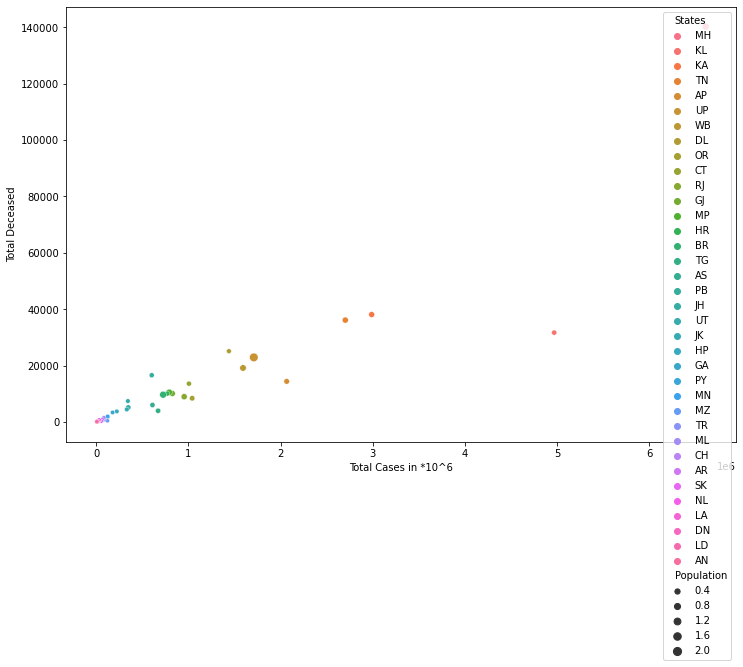

In [ ]:
fig = plt.figure(figsize=(12,8))
sns.scatterplot(data=daily_cases_statewise,x="Total Cases",y="Total Deceased",hue="States" ,size="Population")
plt.xlabel('Total Cases in *10^6')
#for line in range(1,daily_cases_statewise.shape[0]):
 # plt.text(daily_cases_statewise['Total Cases'][line]+0.2, daily_cases_statewise['Total Deceased'][line], daily_cases_statewise['States'][line], horizontalalignment='left', size='medium', color='black', weight='semibold')
#plt.show()

Grouping data on the basis of dates.

In [ ]:
daily_cases_dateswise = dataset_merged_daily.groupby("Dates").agg({"Daily Confirmed":np.sum,
                                                                    "Daily Recovered":np.sum,
                                                                    "Daily Deceased" :np.sum,
                                                                    "Daily Tested"   :np.sum,
                                                                    "Daily Vaccinated":np.sum
}).reset_index()
daily_cases_dateswise.columns = ["Dates","Total Cases","Total Recovered","Total Deceased","Total Tested","Total Vaccinated"]

daily_cases_dateswise

,Dates,Total Cases,Total Recovered,Total Deceased,Total Tested,Total Vaccinated
0,2020-01-30,2.0,0.0,0.0,0.0,0.0
1,2020-02-02,2.0,0.0,0.0,0.0,0.0
2,2020-02-03,2.0,0.0,0.0,0.0,0.0
3,2020-02-14,0.0,6.0,0.0,0.0,0.0
4,2020-03-02,4.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...
608,2021-10-27,32702.0,34154.0,1468.0,2702866.0,3878852.0
609,2021-10-28,28614.0,26378.0,1610.0,2791293.0,5897177.0
610,2021-10-29,28430.0,27098.0,1102.0,2973320.0,4988700.0
611,2021-10-30,25880.0,29344.0,890.0,2678107.0,5361980.0


In [ ]:
daily_cases_dateswise.set_index("Dates",inplace=True)

In [ ]:
daily_cases_dateswise.index = pd.to_datetime(daily_cases_dateswise.index)
daily_cases_dateswise.index[0]

Timestamp('2020-01-30 00:00:00')

In [ ]:
#%matplotlib inline
#daily_cases_dateswise["Total Cases"].resample('M').sum().plot()

### Plotting confirmed cases and deceased information by date.
This graph shows us the increase and decrease in the **covid 19 trend**.

From the graph we can see that covid 19 cases **peaked** in september 2020 (1st wave peak) and may 2021 (2nd wave peak).

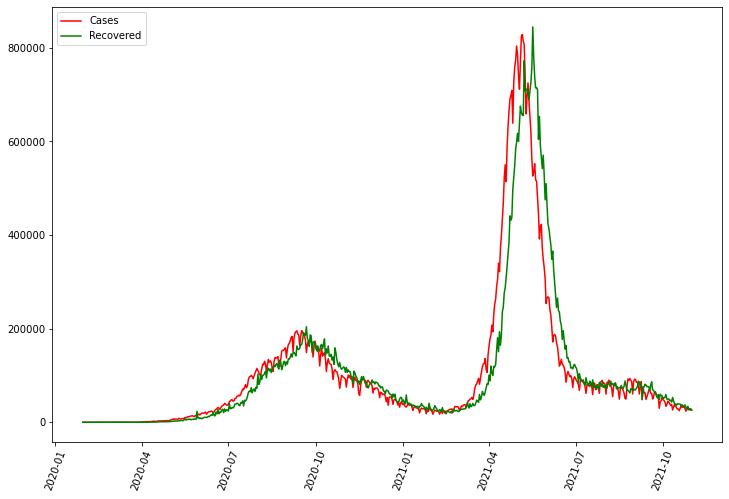

In [ ]:
fig = plt.figure(figsize=(12,8))
plt.plot(daily_cases_dateswise.index,daily_cases_dateswise["Total Cases"],color="r",label='Cases')
plt.plot(daily_cases_dateswise.index,daily_cases_dateswise["Total Recovered"],color='g',label='Recovered')
plt.xticks(rotation=70)
plt.legend(loc="upper left")
plt.show()


Plotting deaths info by dates.

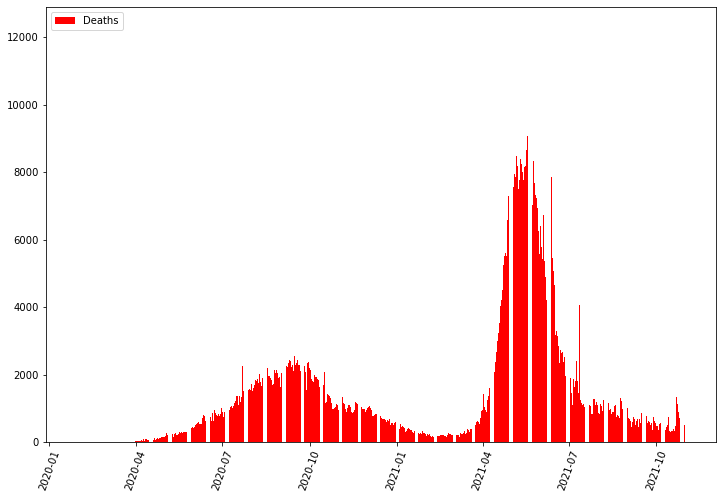

In [ ]:
fig = plt.figure(figsize=(12,8))
plt.xticks(rotation=70)
plt.bar(daily_cases_dateswise.index,daily_cases_dateswise['Total Deceased'], color="r" ,label="Deaths")
plt.legend(loc="upper left")



Compairing recovered and confirmed cases by dates.

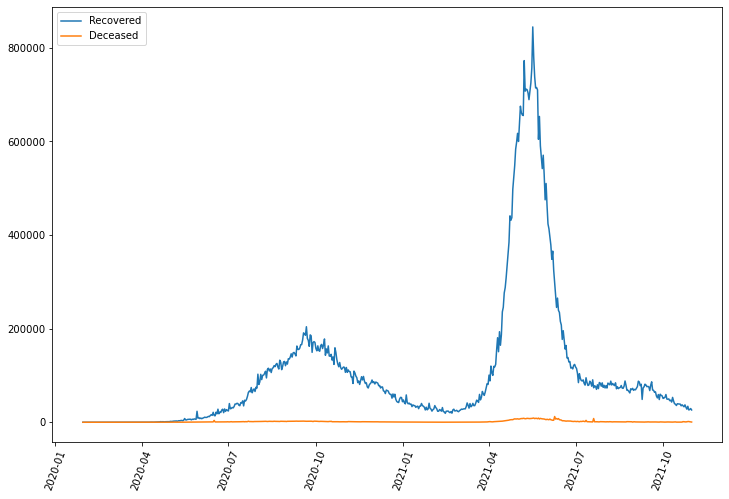

In [ ]:
fig = plt.figure(figsize=(12,8))
plt.xticks(rotation=70)
plt.plot(daily_cases_dateswise.index,daily_cases_dateswise["Total Recovered"],label="Recovered")
plt.plot(daily_cases_dateswise.index,daily_cases_dateswise["Total Deceased"],label='Deceased')
plt.legend(loc="upper left")



## Calculating Active, Test positivity Ratio, Case fatility Ratio.
### Active = Total confirmed cases - Total recovered - total deceased
### Test Positivity Ratio (%ge) =  (total confirmed cases / total people tested) * 100
### Case fatality ration (%ge) = (total deceased / total confirmed cases) * 100

**Active:** This shows us the number of people who are *currently infected* with covid 19. This information is very important because it tells us the number of people who require midical need and if our hospitals are capable to handle such numbers. 

**Test Positivity Ratio:** This tells us about the *percentage* of people who covid positive out of the total tested people. 

In [ ]:
daily_cases_dateswise['Active'] = daily_cases_dateswise["Total Cases"]-daily_cases_dateswise['Total Recovered']-daily_cases_dateswise["Total Deceased"]
daily_cases_dateswise['Test Positivity Ratio'] = daily_cases_dateswise["Total Cases"]/daily_cases_dateswise['Total Tested']*100
daily_cases_dateswise["Case Fatality Ratio"] = daily_cases_dateswise["Total Deceased"]/daily_cases_dateswise['Total Cases']*100
daily_cases_dateswise



,Total Cases,Total Recovered,Total Deceased,Total Tested,Total Vaccinated,Active,Test Positivity Ratio,Case Fatality Ratio
Dates,,,,,,,,
2020-01-30,2.0,0.0,0.0,0.0,0.0,2.0,inf,0.000000
2020-02-02,2.0,0.0,0.0,0.0,0.0,2.0,inf,0.000000
2020-02-03,2.0,0.0,0.0,0.0,0.0,2.0,inf,0.000000
2020-02-14,0.0,6.0,0.0,0.0,0.0,-6.0,NaN,NaN
2020-03-02,4.0,0.0,0.0,0.0,0.0,4.0,inf,0.000000
...,...,...,...,...,...,...,...,...
2021-10-27,32702.0,34154.0,1468.0,2702866.0,3878852.0,-2920.0,1.209901,4.489022
2021-10-28,28614.0,26378.0,1610.0,2791293.0,5897177.0,626.0,1.025116,5.626616
2021-10-29,28430.0,27098.0,1102.0,2973320.0,4988700.0,230.0,0.956170,3.876187


### Plotting covid cases and active cases by dates.

This graph shows us that at the time of a covid wave when **cases** starts to *increase* the **active** cases are positive which means that daily confirmed are far more than the combined value of deceased and recovered people. This shows us more people are getting **infected.**

When we look at the later half of the wave when **cases** starts to *decrease* the **active** cases are negetive which means that daily confirmed cases are lower than the daily deceased and recovered people. this shows us that more people are getting **recovered.**

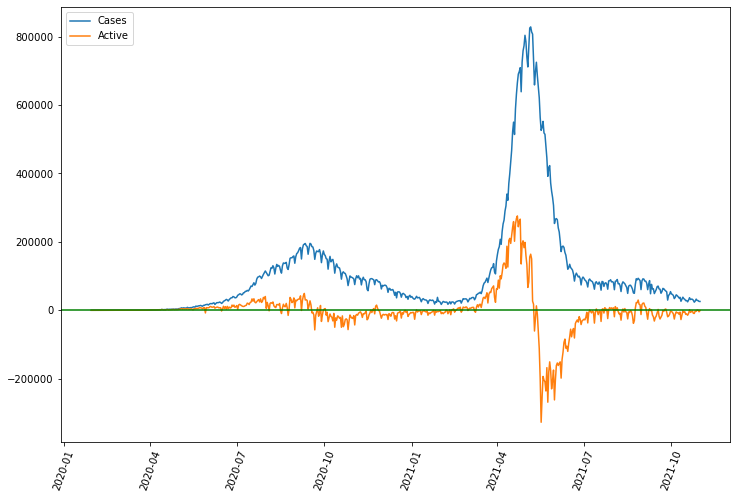

In [ ]:
fig = plt.figure(figsize=(12,8))
plt.xticks(rotation=70)
plt.plot(daily_cases_dateswise.index,daily_cases_dateswise["Total Cases"],label="Cases")
plt.plot(daily_cases_dateswise.index,daily_cases_dateswise["Active"],label='Active')
plt.axhline(0,color='g')
plt.legend(loc="upper left")

ploting test positivity ratio by dates.

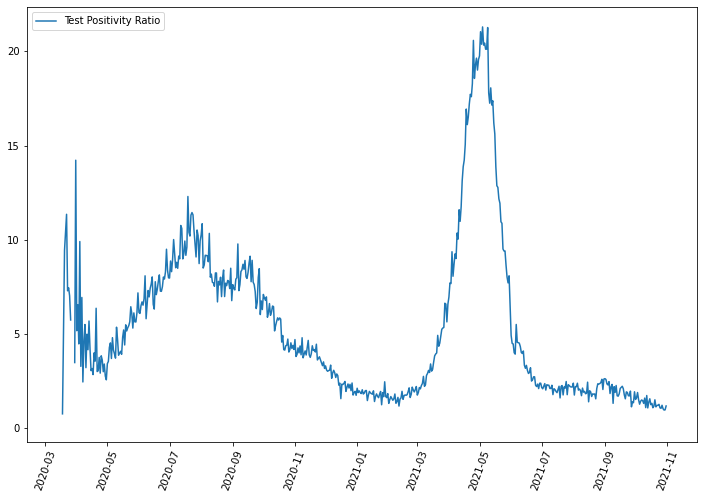

In [ ]:
fig = plt.figure(figsize=(12,8))
plt.xticks(rotation=70)
plt.plot(daily_cases_dateswise.index,daily_cases_dateswise["Test Positivity Ratio"],label='Test Positivity Ratio')
plt.legend(loc="upper left")

Plotting Fatallity ratio of each State/Ut. 

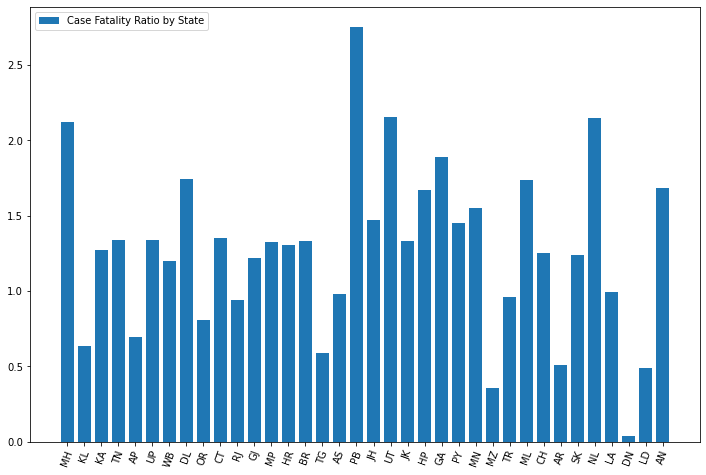

In [ ]:
fig = plt.figure(figsize=(12,8))
plt.xticks(rotation=70)
plt.bar(daily_cases_statewise['States'],daily_cases_statewise["Case Fatality Ratio"],label = "Case Fatality Ratio by State")
plt.legend(loc = "upper left")


Plotting fatality ratio by dates.

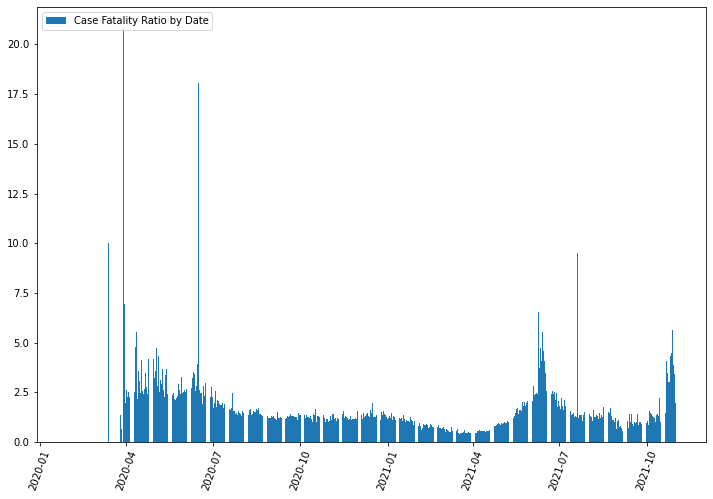

In [ ]:
fig = plt.figure(figsize=(12,8))
plt.xticks(rotation=70)
plt.bar(daily_cases_dateswise.index,daily_cases_dateswise["Case Fatality Ratio"],label = "Case Fatality Ratio by Date")
plt.legend(loc = "upper left")